In [1]:
# !conda install -c plotly -y plotly

In [2]:
import matplotlib.pyplot as plt
from tensorflow import keras
import numpy as np
import plotly.graph_objects as go

In [3]:
(X_train, y_train), (X_test, y_test) = keras.datasets.mnist.load_data()

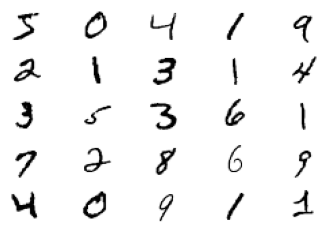

In [4]:
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(X_train[i], cmap=plt.cm.Greys)
    plt.axis('off')

## Dense Network with a Bottleneck Layer

A bottleneck layer is a layer with only a few neurons that forces the network to encode the input information into as little features as possible! It's great for visualizing what's going on inside a dense network.

In [5]:
network = keras.models.Sequential()

network.add(keras.layers.Flatten(input_shape=(28, 28, )))
network.add(keras.layers.BatchNormalization())
network.add(keras.layers.Dense(512, activation=keras.activations.relu))



#### INTENTIONALLY ADD "BOTTLENECK LAYER"          
network.add(keras.layers.Dense(3, 'sigmoid', name='bottleneck'))



network.add(keras.layers.Dense(512, 'relu'))
network.add(keras.layers.Dense(10, 'softmax'))

# For a multi-class classification problem
network.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [6]:
network.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
batch_normalization (BatchNo (None, 784)               3136      
_________________________________________________________________
dense (Dense)                (None, 512)               401920    
_________________________________________________________________
bottleneck (Dense)           (None, 3)                 1539      
_________________________________________________________________
dense_1 (Dense)              (None, 512)               2048      
_________________________________________________________________
dense_2 (Dense)              (None, 10)                5130      
Total params: 413,773
Trainable params: 412,205
Non-trainable params: 1,568
______________________________________________

In [7]:
history = network.fit(X_train, keras.utils.to_categorical(y_train), 
                      epochs=10,
                      batch_size=128, 
                      validation_split=0.3,
                      verbose=2)

Epoch 1/10
329/329 - 3s - loss: 1.0024 - accuracy: 0.5646 - val_loss: 0.6587 - val_accuracy: 0.6695
Epoch 2/10
329/329 - 2s - loss: 0.4638 - accuracy: 0.8194 - val_loss: 0.4144 - val_accuracy: 0.8889
Epoch 3/10
329/329 - 2s - loss: 0.2225 - accuracy: 0.9429 - val_loss: 0.3770 - val_accuracy: 0.8863
Epoch 4/10
329/329 - 2s - loss: 0.1447 - accuracy: 0.9629 - val_loss: 0.2291 - val_accuracy: 0.9467
Epoch 5/10
329/329 - 2s - loss: 0.1077 - accuracy: 0.9726 - val_loss: 0.2248 - val_accuracy: 0.9489
Epoch 6/10
329/329 - 2s - loss: 0.0828 - accuracy: 0.9785 - val_loss: 0.2629 - val_accuracy: 0.9391
Epoch 7/10
329/329 - 2s - loss: 0.0664 - accuracy: 0.9830 - val_loss: 0.2326 - val_accuracy: 0.9516
Epoch 8/10
329/329 - 2s - loss: 0.0545 - accuracy: 0.9854 - val_loss: 0.2362 - val_accuracy: 0.9532
Epoch 9/10
329/329 - 2s - loss: 0.0466 - accuracy: 0.9882 - val_loss: 0.2593 - val_accuracy: 0.9505
Epoch 10/10
329/329 - 2s - loss: 0.0391 - accuracy: 0.9897 - val_loss: 0.2594 - val_accuracy: 0.9525

## Extract the bottleneck layer

We included a layer with just three neurons on purpose. By doing so we can visualize the feature space of this layer. Usually this is not a good idea because we artificially constrain the parameter space of our model.

In [8]:
network.get_layer(name='bottleneck')

In [9]:
intermediate_layer_model = keras.Model(inputs=network.input,
                                 outputs=network.get_layer(name='bottleneck').output)

In [10]:
intermediate_layer_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_input (InputLayer)   [(None, 28, 28)]          0         
_________________________________________________________________
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
batch_normalization (BatchNo (None, 784)               3136      
_________________________________________________________________
dense (Dense)                (None, 512)               401920    
_________________________________________________________________
bottleneck (Dense)           (None, 3)                 1539      
Total params: 406,595
Trainable params: 405,027
Non-trainable params: 1,568
_________________________________________________________________


In [11]:
x_bottleneck = intermediate_layer_model.predict(X_train)
# the images are transformed into a 2 dimensional feature matrix with 3 features
x_bottleneck.shape

(60000, 3)

(60_000, 784) ---> (60_000, 3)

> Meaning is derived from the pairwise relationshiop between things. [...] These relationships can be captured by a distance function.
(Francois Chollet, Deep Learning with Python, p. 317)

In [12]:
# we can visualize this!
fig = go.Figure(data=[
    go.Scatter3d(
        # extract the three features from the bottleneck layer
        x=x_bottleneck[:,0],
        y=x_bottleneck[:,1],
        z=x_bottleneck[:,2],
        mode='markers',
        hovertext=y_train,
        # define how the points should look like
        marker=dict(
            size=3,
            color=y_train,            # set color to an array/list of desired values
            colorscale='spectral',   # choose a colorscale
            opacity=0.8
        ))
])

# make it a little bit nicer
fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=0),
    scene = dict(
                    xaxis_title='X1',
                    yaxis_title='X2',
                    zaxis_title='X3'
    )
)


In [13]:
fig.write_html('viz.html')

In [14]:
!open viz.html

/bin/bash: open: command not found
